In [1]:
import os
import cv2
import torch
import random
import itertools
import shutil
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [2]:
# Paths to the data
train_image_dir = '../data/raw/train/images'
train_label_dir = '../data/raw/train/labels'
val_image_dir = '../data/raw/valid/images'
val_label_dir = '../data/raw/valid/labels'
test_image_dir = '../data/raw/test/images'
test_label_dir = '../data/raw/test/labels'

train_processed_images_dir = '../data/processed/train/images'
train_processed_labels_dir = '../data/processed/train/labels'
val_processed_images_dir = '../data/processed/valid/images'
val_processed_labels_dir = '../data/processed/valid/labels'
test_processed_images_dir = '../data/processed/test/images'
test_processed_labels_dir = '../data/processed/test/labels'

In [3]:
def collate_fn(batch):
    """
    Custom collate function to handle variable number of bounding boxes.
    """
    images = []
    labels = []

    for image, label in batch:
        images.append(torch.tensor(image).permute(2, 0, 1))  # Convert image to tensor (C, H, W)
        labels.append(torch.tensor(label))  # Keep labels as a list of bounding boxes

    return images, labels


In [4]:
class LicensePlateDataset(Dataset):
    def __init__(self, image_dir, label_dir, target_size=(128, 128), transform=None):
        """
        Dataset for license plates with multiple bounding boxes.
        - image_dir: Folder containing images.
        - label_dir: Folder containing labels (.txt files).
        - target_size: Tuple (width, height) to resize images.
        - transform: Image transformer (data augmentation, normalization, ...).
        """
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.target_size = target_size
        self.transform = transform

        # List image and label files
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.PNG'))]
        self.label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

        # Ensure matching files between images and labels
        assert len(self.image_files) == len(self.label_files), f"Mismatch between images {len(self.image_files)} and labels {len(self.label_files)}."

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Paths to image and label
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        label_path = os.path.join(self.label_dir, self.label_files[idx])

        # Load image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
        original_height, original_width = image.shape[:2]
        image = cv2.resize(image, self.target_size)

        # Load label (each line represents a bounding box)
        bboxes = []
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = list(map(float, line.strip().split()))
                class_id, x_center, y_center, width, height = parts
                # Scale bounding boxes to resized image dimensions
                x_center *= self.target_size[0]
                y_center *= self.target_size[1]
                width *= self.target_size[0]
                height *= self.target_size[1]
                bboxes.append([class_id, x_center, y_center, width, height])

        # Convert bounding boxes to tensor
        bboxes = torch.tensor(bboxes, dtype=torch.float32)

        # Apply transforms to the image
        if self.transform:
            image = self.transform(image)

        return image, bboxes

In [5]:
def add_border(image, labels, low, high):
    """
    Add border to the image, resize it back to the original size,
    and adjust bounding box labels accordingly.

    Args:
        image (np.ndarray): Input image as a NumPy array (H, W, C).
        labels (list): List of bounding boxes in YOLO format (class_id, x_center, y_center, bbox_width, bbox_height).
        low (int): Minimum size of the border.
        high (int): Maximum size of the border.

    Returns:
        np.ndarray, list: Augmented image and adjusted labels.
    """
    # Randomize border sizes
    top = random.randint(low, high)
    bottom = random.randint(low, high)
    left = random.randint(low, high)
    right = random.randint(low, high)

    original_width, original_height = image.shape[1], image.shape[0]

    # Add border to the image
    image_with_border = cv2.copyMakeBorder(image, top, bottom, left, right, cv2.BORDER_REPLICATE)

    # Resize image back to original size
    resized_image = cv2.resize(image_with_border, (original_width, original_height))

    # Adjust bounding boxes
    new_labels = []
    border_width = left + right
    border_height = top + bottom
    scale_x = original_width / (original_width + border_width)
    scale_y = original_height / (original_height + border_height)

    for class_id, x_center, y_center, bbox_width, bbox_height in labels:
        # Adjust bounding box positions and sizes
        x_center_new = (x_center * original_width + left) / (original_width + border_width)
        y_center_new = (y_center * original_height + top) / (original_height + border_height)
        bbox_width_new = bbox_width * scale_x
        bbox_height_new = bbox_height * scale_y

        new_labels.append((class_id, x_center_new, y_center_new, bbox_width_new, bbox_height_new))

    return resized_image, new_labels



def random_crop(image, labels):
    """
    Crop the image randomly without cutting into any bounding boxes.
    Adjust the bounding boxes accordingly.

    Args:
        image (np.ndarray): Input image as a NumPy array (H, W, C).
        labels (list): List of bounding boxes in YOLO format (class_id, x_center, y_center, bbox_width, bbox_height).

    Returns:
        np.ndarray, list: Cropped and resized image, adjusted bounding boxes.
    """
    original_width, original_height = image.shape[1], image.shape[0]

    # Convert bounding boxes to absolute pixel coordinates
    bboxes_absolute = []
    for class_id, x_center, y_center, bbox_width, bbox_height in labels:
        x_min = (x_center - bbox_width * 0.5) * original_width
        y_min = (y_center - bbox_height * 0.5) * original_height
        x_max = (x_center + bbox_width * 0.5) * original_width
        y_max = (y_center + bbox_height * 0.5) * original_height
        bboxes_absolute.append((class_id, x_min, y_min, x_max, y_max))

    # Find a valid crop region
    for _ in range(100):  # Try up to 100 attempts to find a valid crop
        x_left = random.randint(0, int(original_width * 0.3))
        x_right = random.randint(3 * int(original_width * 0.3), original_width)
        y_top = random.randint(0, int(original_height * 0.3))
        y_bottom = random.randint(3 * int(original_height * 0.3), original_height)

        # Check if the crop region overlaps with any bounding boxes
        is_valid_crop = all(
            x_left <= x_min and x_right >= x_max and y_top <= y_min and y_bottom >= y_max
            for _, x_min, y_min, x_max, y_max in bboxes_absolute
        )

        if is_valid_crop:
            break
    else:
        # If no valid crop found, return the original image
        return image, labels
        
    # Crop the image
    cropped_image = image[y_top:y_bottom, x_left:x_right]

    # Adjust bounding boxes to the new crop region
    adjusted_labels = []
    for class_id, x_min, y_min, x_max, y_max in bboxes_absolute:
        # Adjust coordinates to the cropped image
        x_min_new = x_min - x_left
        y_min_new = y_min - y_top
        x_max_new = x_max - x_left
        y_max_new = y_max - y_top

        # Convert back to YOLO format
        bbox_width = (x_max_new - x_min_new) / (x_right - x_left)
        bbox_height = (y_max_new - y_min_new) / (y_bottom - y_top)
        x_center = (x_min_new + x_max_new) * 0.5 / (x_right - x_left)
        y_center = (y_min_new + y_max_new) * 0.5 / (y_bottom - y_top)

        adjusted_labels.append([class_id, x_center, y_center, bbox_width, bbox_height])

    # Resize the cropped image back to the original size
    cropped_image = cv2.resize(cropped_image, (original_width, original_height))

    return cropped_image, adjusted_labels



def change_brightness(image, label, value):
    """
    Change the brightness of the image and keep the label unchanged.
    """
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    # Change the brightness
    v = cv2.add(v, value)
    v = np.clip(v, 0, 255)  # Ensure pixel values are in range [0, 255]

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)

    return img, label  # Label unchanged



def rotate_image(image, label, range_angle):
    """
    Rotate the image and adjust the bounding boxes accordingly.
    """
    original_width, original_height = image.shape[1], image.shape[0]
    angle = random.randint(-range_angle, range_angle)

    # Rotation matrix
    rot_mat = cv2.getRotationMatrix2D((original_width * 0.5, original_height * 0.5), angle, 1.0)
    rotated_image = cv2.warpAffine(image, rot_mat, (original_width, original_height))

    # Adjust bounding boxes
    adjusted_labels = []
    for bbox in label:
        class_id, x_center, y_center, width, height = bbox

        # Convert YOLO bbox to absolute pixel coordinates
        x_center_pixel = x_center * original_width
        y_center_pixel = y_center * original_height
        width_pixel = width * original_width
        height_pixel = height * original_height

        # Rotate the bounding box
        points = [
            [x_center_pixel - width_pixel * 0.5, y_center_pixel - height_pixel * 0.5],
            [x_center_pixel + width_pixel * 0.5, y_center_pixel - height_pixel * 0.5],
            [x_center_pixel + width_pixel * 0.5, y_center_pixel + height_pixel * 0.5],
            [x_center_pixel - width_pixel * 0.5, y_center_pixel + height_pixel * 0.5]
        ]
        rotated_points = np.array([cv2.transform(np.array([[pt]], dtype=np.float32), rot_mat)[0][0] for pt in points])

        # Calculate the new bounding box
        x_coords = rotated_points[:, 0]
        y_coords = rotated_points[:, 1]

        x_center_new = (max(x_coords) + min(x_coords)) * 0.5 / original_width
        y_center_new = (max(y_coords) + min(y_coords)) * 0.5 / original_height
        width_new = (max(x_coords) - min(x_coords)) / original_width
        height_new = (max(y_coords) - min(y_coords)) / original_height

        # Ignore invalid boxes
        if width_new > 0 and height_new > 0:
            adjusted_labels.append([class_id, x_center_new, y_center_new, width_new, height_new])

    return rotated_image, adjusted_labels



def save_image_and_labels(image, labels, output_image_path, output_labels_path):
    """
    Save the processed image and labels to disk.

    Args:
        image (np.ndarray): Processed image.
        labels (list): List of bounding boxes.
        output_image_path (str): Path to save the processed image.
        output_labels_path (str): Path to save the labels.
    """
    # Save image
    cv2.imwrite(output_image_path, image)

    # Save labels
    with open(output_labels_path, 'w') as label_file:
        for bbox in labels:
            class_id, x_center, y_center, width, height = bbox
            label_file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")



def resize_image_and_labels(image, labels, target_size):
    """Resize image and adjust bounding boxes for the new size."""
    original_height, original_width = image.shape[:2]
    target_width, target_height = target_size
    scale_x = target_width / original_width
    scale_y = target_height / original_height

    # Resize image
    resized_image = cv2.resize(image, (target_width, target_height))

    # Adjust labels
    resized_labels = []
    for label in labels:
        class_id, x_center, y_center, width, height = label
        x_center *= scale_x
        y_center *= scale_y
        width *= scale_x
        height *= scale_y
        resized_labels.append([class_id, x_center / target_width, y_center / target_height, width / target_width, height / target_height])

    return resized_image, resized_labels



def apply_all_augmentations(image_dir, label_dir, output_image_dir, output_labels_dir, target_size=(416, 416)):
    """
    Apply all augmentations and their combinations to images from a directory.
    Resize all images to `target_size` before applying augmentations.
    Save results to the output directory with a progress bar.

    Args:
        image_dir (str): Directory containing original images.
        label_dir (str): Directory containing corresponding YOLO labels.
        output_image_dir (str): Directory to save augmented images.
        output_labels_dir (str): Directory to save augmented labels.
        target_size (tuple): Desired size (width, height) for all images and labels.
    """
    if not os.path.exists(output_image_dir):
        os.makedirs(output_image_dir)
    if not os.path.exists(output_labels_dir):
        os.makedirs(output_labels_dir)

    # List all image files
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.PNG'))]
    
    # Define augmentations
    augmentations = {
        "rotate": lambda img, lbl: rotate_image(img, lbl, 45),
        "crop": lambda img, lbl: random_crop(img, lbl),
        "border": lambda img, lbl: add_border(img, lbl, low=10, high=300),
        "brightness": lambda img, lbl: change_brightness(img, lbl, random.randint(-50, 50))
    }

    # Calculate total progress steps
    total_steps = len(image_files) + len(image_files) * (
        len(augmentations) +
        sum(len(list(itertools.combinations(augmentations.keys(), size))) for size in range(2, len(augmentations) + 1))
    )

    with tqdm(total=total_steps, desc="Processing dataset") as pbar:
        for image_file in image_files:
            # Read the image
            image_path = os.path.join(image_dir, image_file)
            image = cv2.imread(image_path)

            # Read the corresponding label file
            label_file = os.path.splitext(image_file)[0] + ".txt"
            label_path = os.path.join(label_dir, label_file)
            
            # Skip if the label file doesn't exist
            if not os.path.exists(label_path):
                continue
            
            # Copy image and labels to the output directory
            output_image_path = os.path.join(output_image_dir, image_file)
            output_labels_path = os.path.join(output_labels_dir, label_file)
            shutil.copy(image_path, output_image_path)
            pbar.update(1)
            
            with open(label_path, 'r') as file:
                labels = []
                for line in file:
                    parts = list(map(float, line.strip().split()))
                    labels.append(parts)

            base_name = os.path.splitext(image_file)[0]

            # Resize image and labels to target size
            resized_image, resized_labels = resize_image_and_labels(image, labels, target_size)

            # Apply each augmentation
            for aug_name, aug_fn in augmentations.items():
                augmented_img, augmented_label = aug_fn(resized_image, resized_labels)
                output_image_path = os.path.join(output_image_dir, f"{base_name}_{aug_name}.jpg")
                output_labels_path = os.path.join(output_labels_dir, f"{base_name}_{aug_name}.txt")
                
                # Save augmented image and labels
                save_image_and_labels(augmented_img, augmented_label, output_image_path, output_labels_path)
                pbar.update(1)

            # Apply combinations of augmentations
            for combo_size in range(2, len(augmentations) + 1):
                combos = itertools.combinations(augmentations.keys(), combo_size)

                for combo in combos:
                    augmented_img = resized_image.copy()
                    augmented_label = resized_labels.copy()
                    combo_name = "_".join(combo)

                    # Apply each augmentation in the combination
                    for aug_name in combo:
                        augmented_img, augmented_label = augmentations[aug_name](augmented_img, augmented_label)

                    # Save the augmented image and labels
                    output_image_path = os.path.join(output_image_dir, f"{base_name}_{combo_name}.jpg")
                    output_labels_path = os.path.join(output_labels_dir, f"{base_name}_{combo_name}.txt")
                    save_image_and_labels(augmented_img, augmented_label, output_image_path, output_labels_path)
                    pbar.update(1)


In [ ]:
# # Data augmentation và normalization
# transform = transforms.Compose([
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
# ])

# # Create dataset and dataloader
# train_dataset = LicensePlateDataset(train_image_dir, train_label_dir, (400, 300))
# train_loader = DataLoader(
#         train_dataset, 
#         batch_size=32, 
#         shuffle=True,
#         collate_fn=collate_fn
#     )

# val_dataset = LicensePlateDataset(val_image_dir, val_label_dir, (400, 300))
# val_loader = DataLoader(
#         val_dataset, 
#         batch_size=32, 
#         shuffle=False,
#         collate_fn=collate_fn
#     )

# test_dataset = LicensePlateDataset(test_image_dir, test_label_dir)
# test_loader = DataLoader(
#         test_dataset, 
#         batch_size=32, 
#         shuffle=False,
#         collate_fn=collate_fn
#     )

In [7]:
# Create processed folders if not exist
if not os.path.exists(train_processed_images_dir):
    os.makedirs(train_processed_images_dir)
if not os.path.exists(train_processed_labels_dir):
    os.makedirs(train_processed_labels_dir)
if not os.path.exists(val_processed_images_dir):
    os.makedirs(val_processed_images_dir)
if not os.path.exists(val_processed_labels_dir):
    os.makedirs(val_processed_labels_dir)
if not os.path.exists(test_processed_images_dir):
    os.makedirs(test_processed_images_dir)
if not os.path.exists(test_processed_labels_dir):
    os.makedirs(test_processed_labels_dir)
    
# Empty the processed folders
for folder in [
        train_processed_images_dir, 
        train_processed_labels_dir, 
        val_processed_images_dir, 
        val_processed_labels_dir, 
        test_processed_images_dir, 
        test_processed_labels_dir
    ]:
    for file in os.listdir(folder):
        os.remove(os.path.join(folder, file))

In [8]:
# Apply augmentations to the datasets
apply_all_augmentations(
        train_image_dir, 
        train_label_dir, 
        train_processed_images_dir, 
        train_processed_labels_dir,
        target_size=(800, 600)
    )
apply_all_augmentations(
        val_image_dir, 
        val_label_dir, 
        val_processed_images_dir, 
        val_processed_labels_dir,
        target_size=(800, 600)
    )

Processing dataset: 100%|██████████| 20064/20064 [01:06<00:00, 303.58it/s]


In [9]:
def plot_random_images_with_bboxes(output_image_dir, output_labels_dir, num_images=50):
    """
    Display random images with bounding boxes.

    Args:
        output_image_dir (str): Folder containing processed images.
        output_labels_dir (str): Folder containing processed labels.
        num_images (int): Number of images to display. Default is 50.
    """
    # Get all image files
    image_files = [f for f in os.listdir(output_image_dir) if f.endswith('.jpg')]
    if not image_files:
        raise ValueError("No images found in the directory!")

    # Randomly select `num_images` files
    selected_files = random.sample(image_files, min(num_images, len(image_files)))

    print(f"Displaying {len(selected_files)} random images with bounding boxes.")

    # Display each selected image
    for img_file in selected_files:
        image_path = os.path.join(output_image_dir, img_file)
        label_path = os.path.join(output_labels_dir, img_file.replace('.jpg', '.txt'))

        # Load image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Unable to load image: {image_path}")
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width, _ = image.shape

        # Load labels
        labels = []
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    try:
                        class_id, x_center, y_center, bbox_width, bbox_height = map(float, line.strip().split())
                        labels.append((class_id, x_center, y_center, bbox_width, bbox_height))
                    except ValueError as e:
                        print(f"Error reading label in file {label_path}: {e}")
                        continue

        # Draw bounding boxes
        for class_id, x_center, y_center, bbox_width, bbox_height in labels:
            xmin = int((x_center - bbox_width * 0.5) * width)
            ymin = int((y_center - bbox_height * 0.5) * height)
            xmax = int((x_center + bbox_width * 0.5) * width)
            ymax = int((y_center + bbox_height * 0.5) * height)

            # Draw rectangle and label
            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color=(0, 255, 0), thickness=2)

        # Display image with bounding boxes
        plt.figure(figsize=(8, 6))
        plt.imshow(image)
        plt.title(f"Image: {img_file}")
        plt.axis('off')
        plt.show()


Displaying 50 random images with bounding boxes.


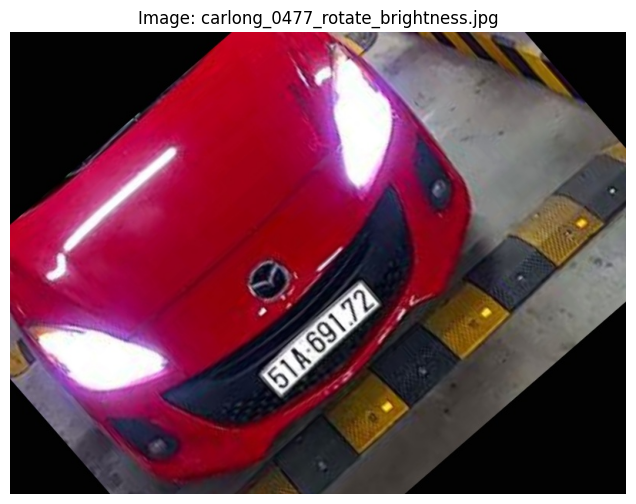

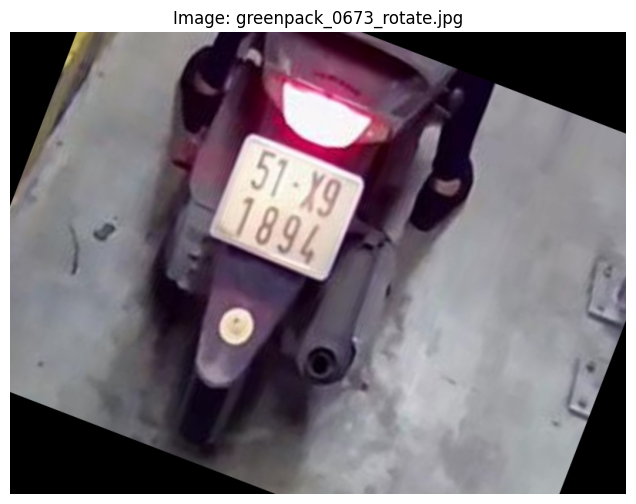

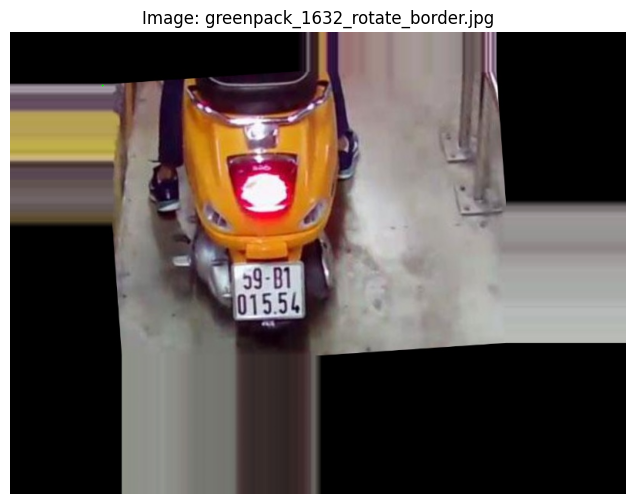

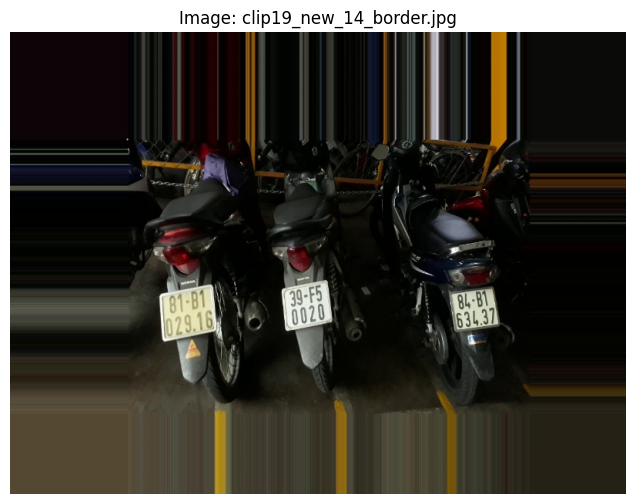

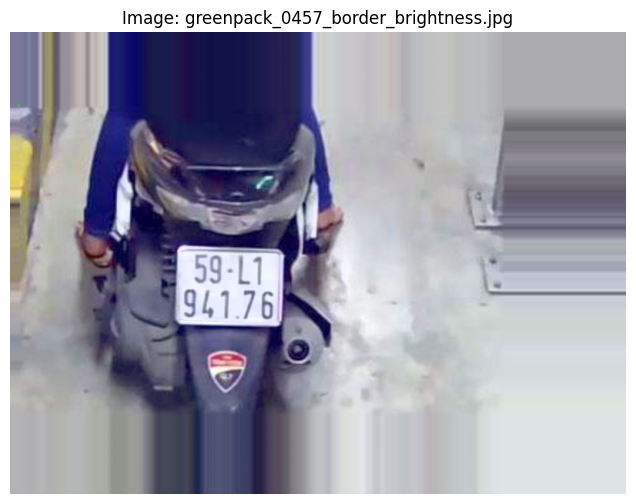

...

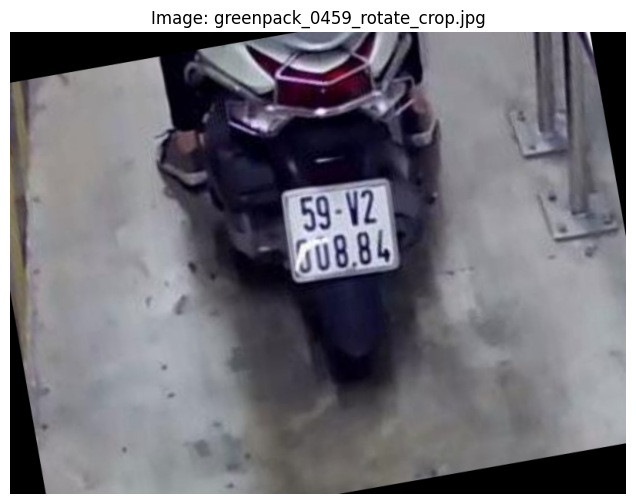

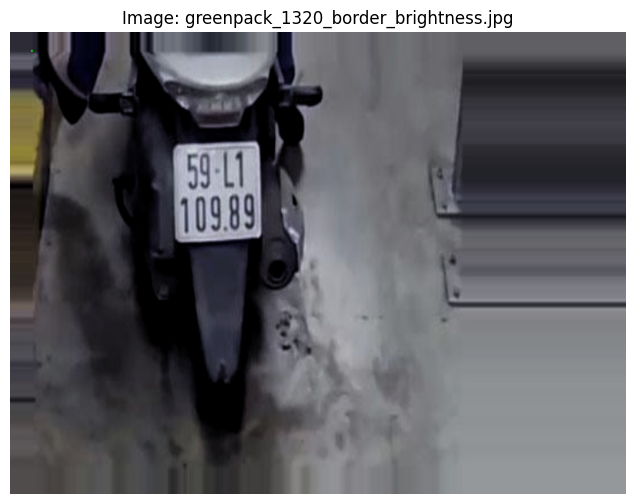

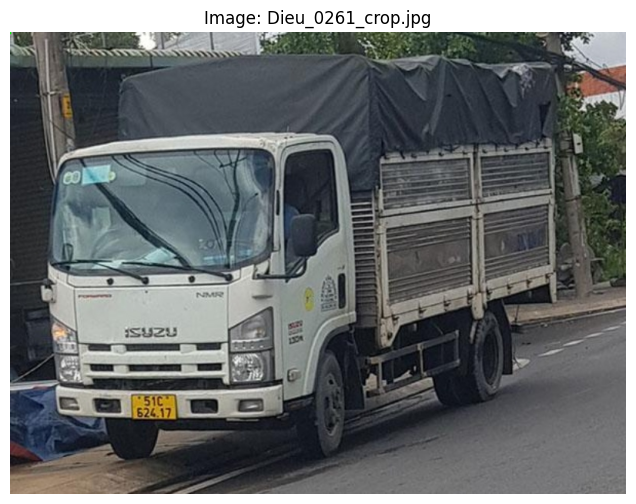

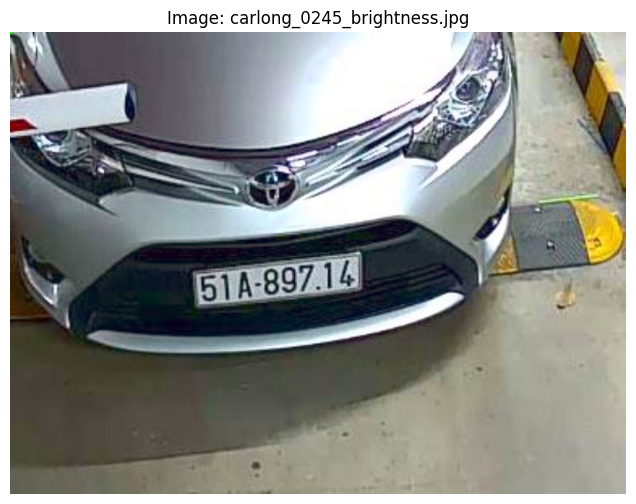

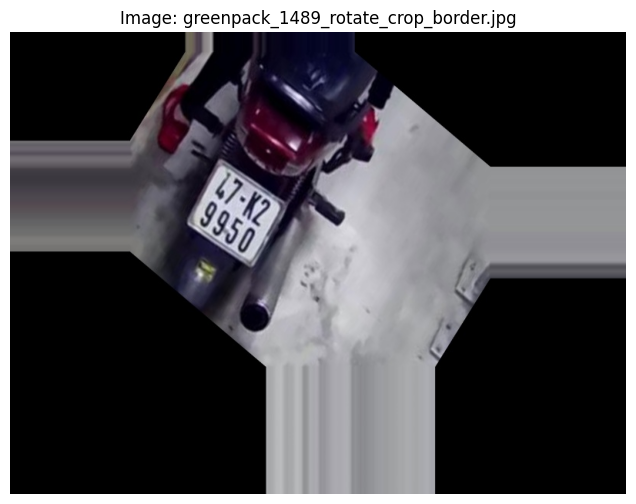

In [10]:
plot_random_images_with_bboxes(train_processed_images_dir, train_processed_labels_dir)